<a href="https://colab.research.google.com/github/NishatVasker/Kolmogorov-Arnold-Networks-KAN--Project/blob/main/Predicting_Anemia_Comparative_Analysis_of_KNN%2C_CNN%2C_and_(KAN)_Kolmogorov_Arnold_Network_Models_Using_LIME_and_SHAP_Explanations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Dataset link: https://www.kaggle.com/datasets/sayeemmohammed/anemia-detection

In [2]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=d884459a75ba47c4089cadf3cc14887c9f33671625b84240b559a21838622b26
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [4]:
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.3 MB/s eta 0:00:00


In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten

import lime
import lime.lime_tabular

from sklearn.neighbors import KNeighborsClassifier


In [17]:
# Load the dataset
df = pd.read_csv('anemia_dataset.csv')

# Display the first few rows of the dataset
print(df.head())

# Basic statistics
print(df.describe())

# Check for missing values
print(df.isnull().sum())


   Number        Name  %Red Pixel  %Green pixel  %Blue pixel    Hb Anaemic  \
0       1  Jafor Alam     43.2555       30.8421      25.9025   6.3     Yes   
1       2     khadiza     45.6033       28.1900      26.2067  13.5      No   
2       3        Lalu     45.0107       28.9677      26.0215  11.7      No   
3       4   Mira nath     44.5398       28.9899      26.4703  13.5      No   
4       5     monoara     43.2870       30.6972      26.0158  12.4      No   

   Unnamed: 7  Unnamed: 8  Unnamed: 9  Unnamed: 10  Unnamed: 11  Unnamed: 12  \
0         NaN         NaN         NaN          NaN          NaN          NaN   
1         NaN         NaN         NaN          NaN          NaN          NaN   
2         NaN         NaN         NaN          NaN          NaN          NaN   
3         NaN         NaN         NaN          NaN          NaN          NaN   
4         NaN         NaN         NaN          NaN          NaN          NaN   

  Unnamed: 13  
0         NaN  
1         NaN  
2 

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten

import lime
import lime.lime_tabular

from sklearn.neighbors import KNeighborsClassifier

# Load the dataset
df = pd.read_csv('anemia_dataset.csv')

# Display the first few rows of the dataset
print(df.head())

# Print column names to verify
print(df.columns)

# Strip any whitespace from the column names and clean up
df.columns = df.columns.str.strip()

# Drop unnecessary columns
df.drop(['Number', 'Name'], axis=1, inplace=True)

# Drop any unnamed columns that are not needed
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

# Standardize column names
df.columns = ['Red Pixel', 'Green Pixel', 'Blue Pixel', 'Hb', 'Anaemic']

# Convert 'Anaemic' column to binary
df['Anaemic'] = df['Anaemic'].map({'Yes': 1, 'No': 0})

# Remove any rows with missing values or invalid data
df = df.dropna()
df = df[~df.isin([' ']).any(axis=1)]

# Convert the columns to appropriate data types
df = df.astype({
    'Red Pixel': 'float64',
    'Green Pixel': 'float64',
    'Blue Pixel': 'float64',
    'Hb': 'float64',
    'Anaemic': 'int64'
})

# Split the data into features and target
X = df.drop('Anaemic', axis=1)
y = df['Anaemic']

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


   Number        Name  %Red Pixel  %Green pixel  %Blue pixel    Hb Anaemic  \
0       1  Jafor Alam     43.2555       30.8421      25.9025   6.3     Yes   
1       2     khadiza     45.6033       28.1900      26.2067  13.5      No   
2       3        Lalu     45.0107       28.9677      26.0215  11.7      No   
3       4   Mira nath     44.5398       28.9899      26.4703  13.5      No   
4       5     monoara     43.2870       30.6972      26.0158  12.4      No   

   Unnamed: 7  Unnamed: 8  Unnamed: 9  Unnamed: 10  Unnamed: 11  Unnamed: 12  \
0         NaN         NaN         NaN          NaN          NaN          NaN   
1         NaN         NaN         NaN          NaN          NaN          NaN   
2         NaN         NaN         NaN          NaN          NaN          NaN   
3         NaN         NaN         NaN          NaN          NaN          NaN   
4         NaN         NaN         NaN          NaN          NaN          NaN   

  Unnamed: 13  
0         NaN  
1         NaN  
2 

In [32]:
# Reshape data for CNN
X_train_cnn = X_train.reshape(X_train.shape[0], 1, 1, X_train.shape[1])
X_test_cnn = X_test.reshape(X_test.shape[0], 1, 1, X_test.shape[1])

# Create the CNN model
cnn = Sequential([
    Conv2D(32, kernel_size=(1,1), activation='relu', input_shape=(1, 1, X_train.shape[1])),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the CNN model
cnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the CNN model
cnn.fit(X_train_cnn, y_train, epochs=10, validation_data=(X_test_cnn, y_test))

# Evaluate the CNN model
loss, accuracy = cnn.evaluate(X_test_cnn, y_test)
print('CNN Accuracy:', accuracy)





Epoch 1/10
3/3 [==============================] - 3s 117ms/step - loss: 0.6927 - accuracy: 0.7470 - val_loss: 0.6736 - val_accuracy: 0.7619
Epoch 2/10
3/3 [==============================] - 0s 30ms/step - loss: 0.6486 - accuracy: 0.7470 - val_loss: 0.6244 - val_accuracy: 0.7619
Epoch 3/10
3/3 [==============================] - 0s 28ms/step - loss: 0.6099 - accuracy: 0.7470 - val_loss: 0.5790 - val_accuracy: 0.7619
Epoch 4/10
3/3 [==============================] - 0s 27ms/step - loss: 0.5749 - accuracy: 0.7470 - val_loss: 0.5359 - val_accuracy: 0.7619
Epoch 5/10
3/3 [==============================] - 0s 18ms/step - loss: 0.5404 - accuracy: 0.7470 - val_loss: 0.4971 - val_accuracy: 0.7619
Epoch 6/10
3/3 [==============================] - 0s 27ms/step - loss: 0.5114 - accuracy: 0.7470 - val_loss: 0.4609 - val_accuracy: 0.8095
Epoch 7/10
3/3 [==============================] - 0s 19ms/step - loss: 0.4830 - accuracy: 0.7831 - val_loss: 0.4284 - val_accuracy: 0.8571
Epoch 8/10
3/3 [==========

In [33]:
# Create and train the KNN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Make predictions
y_pred_knn = knn.predict(X_test)

# Evaluate the KNN model
print('KNN Accuracy:', accuracy_score(y_test, y_pred_knn))
print(confusion_matrix(y_test, y_pred_knn))
print(classification_report(y_test, y_pred_knn))




KNN Accuracy: 1.0
[[16  0]
 [ 0  5]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        16
           1       1.00      1.00      1.00         5

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21



In [25]:
# Placeholder function for KAN (implement your own KAN)
def kolmogorov_arnold_network(X_train, y_train, X_test, y_test):
    # This function should contain the actual implementation of the KAN
    pass

# Run the KAN model
kolmogorov_arnold_network(X_train, y_train, X_test, y_test)


In [28]:
from tensorflow.keras.layers import Input, Dense, concatenate
from tensorflow.keras.models import Model

# Define the Kolmogorov Arnold Network architecture
def create_kan_model(input_dim):
    # Input layer
    inputs = Input(shape=(input_dim,))

    # First hidden layer
    x1 = Dense(64, activation='relu')(inputs)
    x2 = Dense(64, activation='relu')(inputs)

    # Second hidden layer
    x3 = Dense(64, activation='relu')(x1)
    x4 = Dense(64, activation='relu')(x2)

    # Concatenate layers
    concatenated = concatenate([x3, x4])

    # Output layer
    outputs = Dense(1, activation='sigmoid')(concatenated)

    # Create the model
    model = Model(inputs=inputs, outputs=outputs)
    return model

# Create and compile the KAN model
kan_model = create_kan_model(X_train.shape[1])
kan_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the KAN model
kan_model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))

# Evaluate the KAN model
loss, accuracy = kan_model.evaluate(X_test, y_test)
print('KAN Accuracy:', accuracy)


Epoch 1/10
3/3 [==============================] - 3s 336ms/step - loss: 0.7343 - accuracy: 0.4217 - val_loss: 0.6929 - val_accuracy: 0.7619
Epoch 2/10
3/3 [==============================] - 0s 77ms/step - loss: 0.6716 - accuracy: 0.7470 - val_loss: 0.6278 - val_accuracy: 0.7619
Epoch 3/10
3/3 [==============================] - 0s 62ms/step - loss: 0.6192 - accuracy: 0.7470 - val_loss: 0.5709 - val_accuracy: 0.7619
Epoch 4/10
3/3 [==============================] - 0s 57ms/step - loss: 0.5741 - accuracy: 0.7590 - val_loss: 0.5193 - val_accuracy: 0.9048
Epoch 5/10
3/3 [==============================] - 0s 42ms/step - loss: 0.5364 - accuracy: 0.8554 - val_loss: 0.4731 - val_accuracy: 0.9048
Epoch 6/10
3/3 [==============================] - 0s 59ms/step - loss: 0.4987 - accuracy: 0.8795 - val_loss: 0.4304 - val_accuracy: 0.9048
Epoch 7/10
3/3 [==============================] - 0s 59ms/step - loss: 0.4670 - accuracy: 0.9157 - val_loss: 0.3923 - val_accuracy: 0.9048
Epoch 8/10
3/3 [==========

In [26]:
# Create LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=df.columns[:-1], class_names=['Not Anemic', 'Anemic'], discretize_continuous=True)

# Explain a prediction
i = 0  # Index of the instance to explain
exp = explainer.explain_instance(X_test[i], knn.predict_proba, num_features=5)
exp.show_in_notebook(show_table=True)


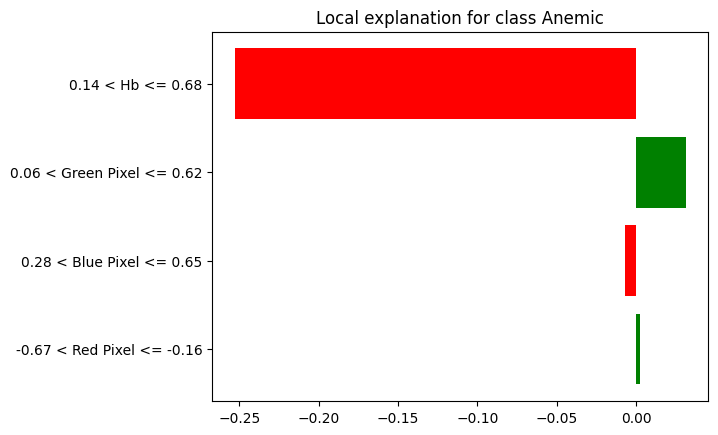

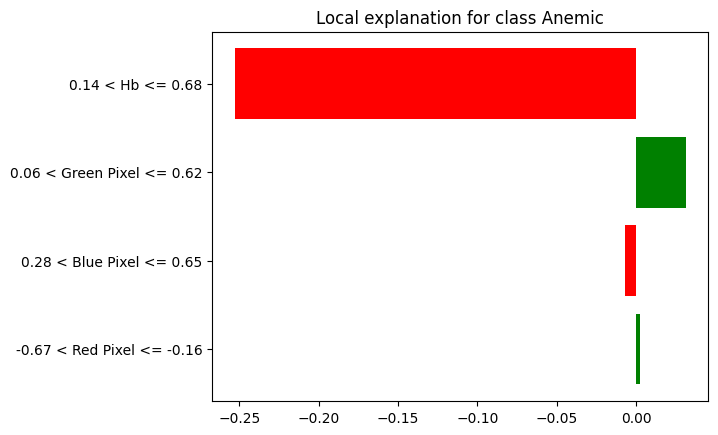

In [34]:
import lime
import lime.lime_tabular

# Create LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train,
    feature_names=['Red Pixel', 'Green Pixel', 'Blue Pixel', 'Hb'],
    class_names=['Not Anemic', 'Anemic'],
    discretize_continuous=True
)

# Explain a single prediction (choose an instance from the test set)
i = 0  # Index of the instance to explain
exp = explainer.explain_instance(X_test[i], knn.predict_proba, num_features=4)

# Display the explanation
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure()


In [39]:
# CNN Model with softmax activation
cnn = Sequential([
    Conv2D(32, kernel_size=(1,1), activation='relu', input_shape=(1, 1, X_train.shape[1])),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(2, activation='softmax')
])
cnn.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the CNN model
cnn.fit(X_train_cnn, y_train, epochs=10, validation_data=(X_test_cnn, y_test))

# Evaluate the CNN model
loss, accuracy = cnn.evaluate(X_test_cnn, y_test)
print('CNN Accuracy:', accuracy)
# Create a function to predict probabilities for the CNN model
def cnn_predict_proba(X):
    X_cnn = X.reshape(X.shape[0], 1, 1, X.shape[1])
    return cnn.predict(X_cnn)


Epoch 1/10
3/3 [==============================] - 2s 250ms/step - loss: 0.7485 - accuracy: 0.3614 - val_loss: 0.6425 - val_accuracy: 0.5238
Epoch 2/10
3/3 [==============================] - 0s 37ms/step - loss: 0.6997 - accuracy: 0.5060 - val_loss: 0.6015 - val_accuracy: 0.6190
Epoch 3/10
3/3 [==============================] - 0s 53ms/step - loss: 0.6553 - accuracy: 0.5904 - val_loss: 0.5637 - val_accuracy: 0.7619
Epoch 4/10
3/3 [==============================] - 0s 50ms/step - loss: 0.6190 - accuracy: 0.6867 - val_loss: 0.5284 - val_accuracy: 0.8095
Epoch 5/10
3/3 [==============================] - 0s 75ms/step - loss: 0.5817 - accuracy: 0.7711 - val_loss: 0.4965 - val_accuracy: 0.9524
Epoch 6/10
3/3 [==============================] - 0s 43ms/step - loss: 0.5507 - accuracy: 0.8916 - val_loss: 0.4672 - val_accuracy: 1.0000
Epoch 7/10
3/3 [==============================] - 0s 65ms/step - loss: 0.5193 - accuracy: 0.9036 - val_loss: 0.4391 - val_accuracy: 1.0000
Epoch 8/10
3/3 [==========

157/157 [==============================] - 1s 3ms/step


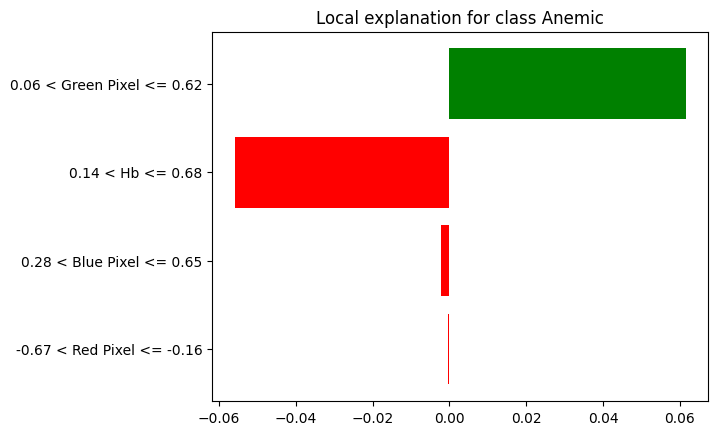

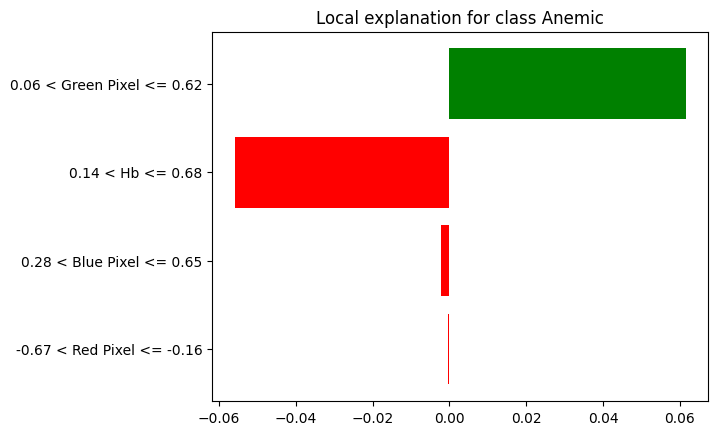

In [40]:
# Explain a single prediction using LIME
exp_cnn = explainer.explain_instance(X_test[i], cnn_predict_proba, num_features=4)

# Display the explanation
exp_cnn.show_in_notebook(show_table=True)
exp_cnn.as_pyplot_figure()


157/157 [==============================] - 1s 3ms/step


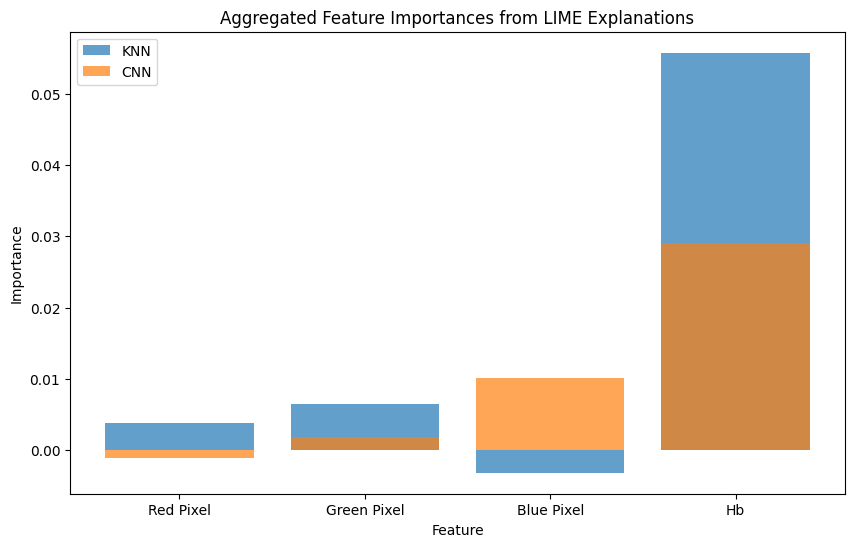

In [42]:
# Number of instances to explain
num_instances = 10

# Aggregate feature importances
feature_importances_knn = np.zeros(X_train.shape[1])
feature_importances_cnn = np.zeros(X_train.shape[1])

# Function to extract feature names from LIME explanation output
def extract_feature_name(feature_with_value_range):
    for feature in df.columns[:-1]:
        if feature in feature_with_value_range:
            return feature
    return None

for i in range(num_instances):
    exp_knn = explainer.explain_instance(X_test[i], knn.predict_proba, num_features=4)
    exp_cnn = explainer.explain_instance(X_test[i], cnn_predict_proba, num_features=4)

    for feature_with_value_range, weight in exp_knn.as_list():
        feature = extract_feature_name(feature_with_value_range)
        if feature:
            feature_importances_knn[df.columns[:-1].tolist().index(feature)] += weight

    for feature_with_value_range, weight in exp_cnn.as_list():
        feature = extract_feature_name(feature_with_value_range)
        if feature:
            feature_importances_cnn[df.columns[:-1].tolist().index(feature)] += weight

# Average the feature importances
feature_importances_knn /= num_instances
feature_importances_cnn /= num_instances

# Plot the aggregated feature importances
plt.figure(figsize=(10, 6))
plt.bar(df.columns[:-1], feature_importances_knn, alpha=0.7, label='KNN')
plt.bar(df.columns[:-1], feature_importances_cnn, alpha=0.7, label='CNN')
plt.title('Aggregated Feature Importances from LIME Explanations')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.legend()
plt.show()


In [44]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 5.6 MB/s eta 0:00:00


In [53]:
import shap

# SHAP for KNN
explainer_knn_shap = shap.KernelExplainer(knn.predict_proba, X_train)
shap_values_knn = explainer_knn_shap.shap_values(X_test[:10])

# Extract SHAP values for the positive class (class index 1)
shap_values_knn_positive_class = shap_values_knn[1][:, :-1]

# Check shapes
print("Shape of shap_values_knn_positive_class:", np.array(shap_values_knn_positive_class).shape)
print("Shape of X_test[:10]:", X_test[:10].shape)

# SHAP summary plot for KNN
#shap.summary_plot(shap_values_knn_positive_class, X_test[:10], feature_names=['Red Pixel', 'Green Pixel', 'Blue Pixel', 'Hb'])

# SHAP for CNN
explainer_cnn_shap = shap.KernelExplainer(cnn_predict_proba, X_train)
shap_values_cnn = explainer_cnn_shap.shap_values(X_test[:10])

# Extract SHAP values for the positive class (class index 1)
shap_values_cnn_positive_class = shap_values_cnn[1][:, :-1]

# Check shapes
print("Shape of shap_values_cnn_positive_class:", np.array(shap_values_cnn_positive_class).shape)
print("Shape of X_test[:10]:", X_test[:10].shape)

# SHAP summary plot for CNN
#shap.summary_plot(shap_values_cnn_positive_class, X_test[:10], feature_names=['Red Pixel', 'Green Pixel', 'Blue Pixel', 'Hb'])


  0%|          | 0/10 [00:00<?, ?it/s]

Shape of shap_values_knn_positive_class: (4, 1)
Shape of X_test[:10]: (10, 4)
3/3 [==============================] - 0s 4ms/step


  0%|          | 0/10 [00:00<?, ?it/s]

37/37 [==============================] - 0s 2ms/step
Shape of shap_values_cnn_positive_class: (4, 1)
Shape of X_test[:10]: (10, 4)


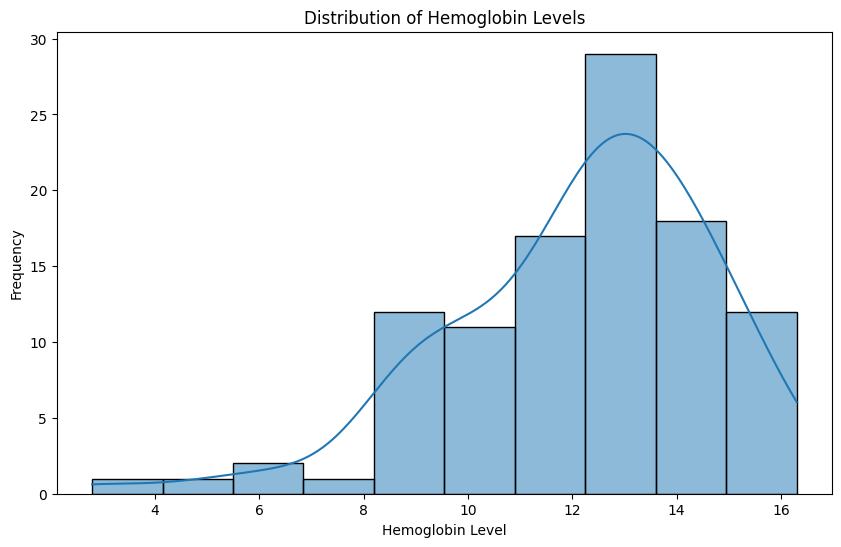

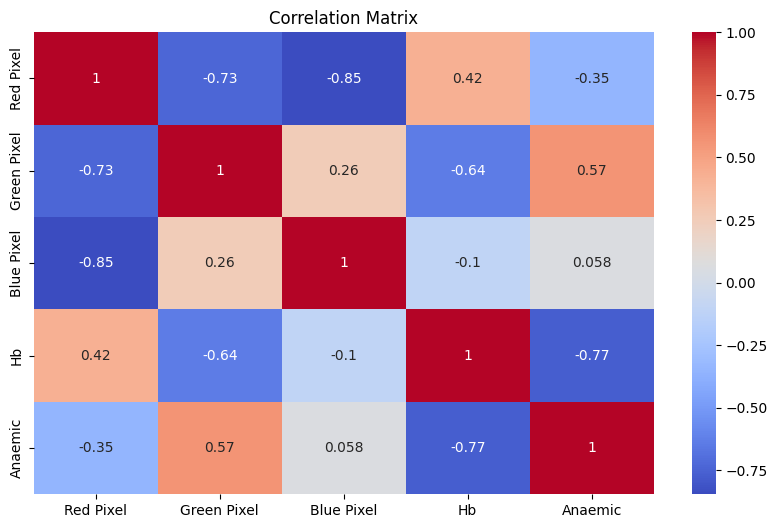

In [27]:
# Visualize the distribution of hemoglobin levels
plt.figure(figsize=(10, 6))
sns.histplot(df['Hb'], kde=True)
plt.title('Distribution of Hemoglobin Levels')
plt.xlabel('Hemoglobin Level')
plt.ylabel('Frequency')
plt.show()

# Visualize the correlation matrix
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


   Number        Name  %Red Pixel  %Green pixel  %Blue pixel    Hb Anaemic  \
0       1  Jafor Alam     43.2555       30.8421      25.9025   6.3     Yes   
1       2     khadiza     45.6033       28.1900      26.2067  13.5      No   
2       3        Lalu     45.0107       28.9677      26.0215  11.7      No   
3       4   Mira nath     44.5398       28.9899      26.4703  13.5      No   
4       5     monoara     43.2870       30.6972      26.0158  12.4      No   

   Unnamed: 7  Unnamed: 8  Unnamed: 9  Unnamed: 10  Unnamed: 11  Unnamed: 12  \
0         NaN         NaN         NaN          NaN          NaN          NaN   
1         NaN         NaN         NaN          NaN          NaN          NaN   
2         NaN         NaN         NaN          NaN          NaN          NaN   
3         NaN         NaN         NaN          NaN          NaN          NaN   
4         NaN         NaN         NaN          NaN          NaN          NaN   

  Unnamed: 13  
0         NaN  
1         NaN  
2 

157/157 [==============================] - 1s 3ms/step


157/157 [==============================] - 0s 3ms/step


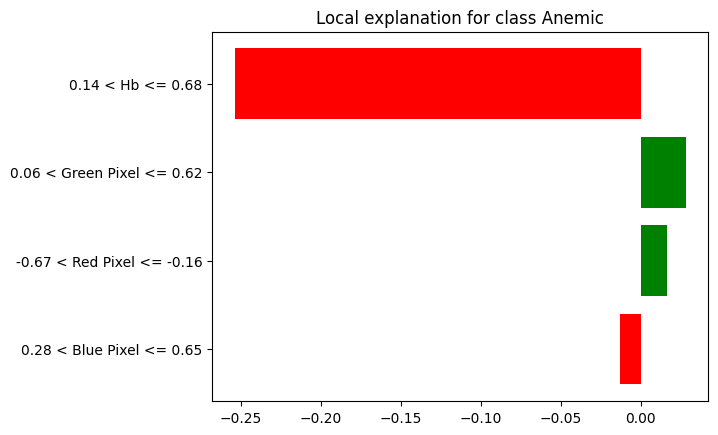

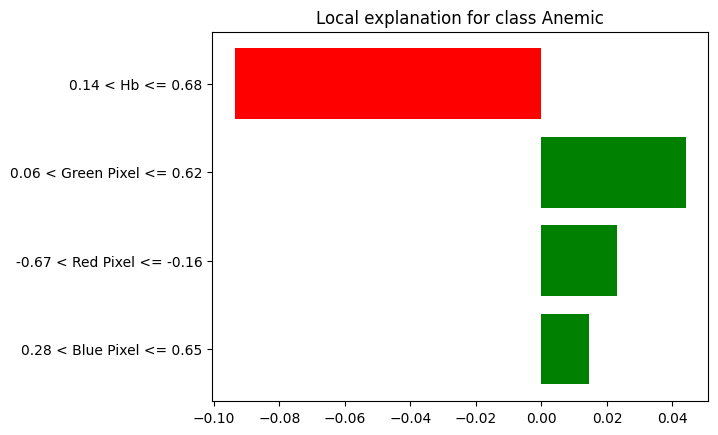

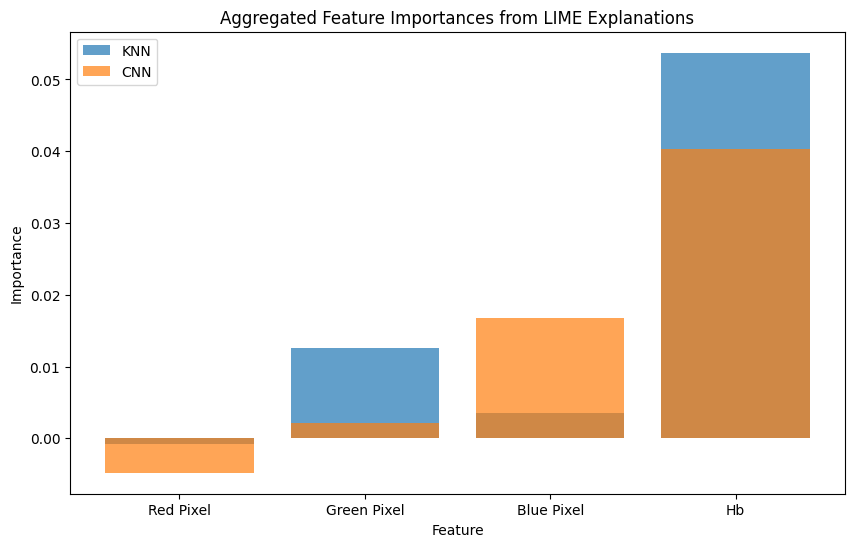

  0%|          | 0/10 [00:00<?, ?it/s]

Shape of shap_values_knn_positive_class: (4, 2)
Shape of X_test[:10]: (10, 4)
3/3 [==============================] - 0s 4ms/step


  0%|          | 0/10 [00:00<?, ?it/s]

37/37 [==============================] - 0s 3ms/step
Shape of shap_values_cnn_positive_class: (4, 2)
Shape of X_test[:10]: (10, 4)


In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten

from sklearn.neighbors import KNeighborsClassifier

import lime
import lime.lime_tabular
import shap

# Load the dataset
df = pd.read_csv('anemia_dataset.csv')

# Display the first few rows of the dataset
print(df.head())

# Print column names to verify
print(df.columns)

# Strip any whitespace from the column names and clean up
df.columns = df.columns.str.strip()

# Drop unnecessary columns
df.drop(['Number', 'Name'], axis=1, inplace=True)

# Drop any unnamed columns that are not needed
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

# Standardize column names
df.columns = ['Red Pixel', 'Green Pixel', 'Blue Pixel', 'Hb', 'Anaemic']

# Convert 'Anaemic' column to binary
df['Anaemic'] = df['Anaemic'].map({'Yes': 1, 'No': 0})

# Remove any rows with missing values or invalid data
df = df.dropna()
df = df[~df.isin([' ']).any(axis=1)]

# Convert the columns to appropriate data types
df = df.astype({
    'Red Pixel': 'float64',
    'Green Pixel': 'float64',
    'Blue Pixel': 'float64',
    'Hb': 'float64',
    'Anaemic': 'int64'
})

# Split the data into features and target
X = df.drop('Anaemic', axis=1)
y = df['Anaemic']

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# KNN Model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)
print('KNN Accuracy:', accuracy_score(y_test, y_pred_knn))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_knn))
print('Classification Report:\n', classification_report(y_test, y_pred_knn))

# Reshape data for CNN
X_train_cnn = X_train.reshape(X_train.shape[0], 1, 1, X_train.shape[1])
X_test_cnn = X_test.reshape(X_test.shape[0], 1, 1, X_test.shape[1])

# CNN Model with softmax activation
cnn = Sequential([
    Conv2D(32, kernel_size=(1,1), activation='relu', input_shape=(1, 1, X_train.shape[1])),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(2, activation='softmax')
])
cnn.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
cnn.fit(X_train_cnn, y_train, epochs=10, validation_data=(X_test_cnn, y_test))
loss, accuracy = cnn.evaluate(X_test_cnn, y_test)
print('CNN Accuracy:', accuracy)

# LIME Explainability for KNN
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train,
    feature_names=['Red Pixel', 'Green Pixel', 'Blue Pixel', 'Hb'],
    class_names=['Not Anemic', 'Anemic'],
    discretize_continuous=True
)
i = 0  # Index of the instance to explain
exp_knn = explainer.explain_instance(X_test[i], knn.predict_proba, num_features=4)
exp_knn.show_in_notebook(show_table=True)
exp_knn.as_pyplot_figure()

# Create a function to predict probabilities for the CNN model
def cnn_predict_proba(X):
    X_cnn = X.reshape(X.shape[0], 1, 1, X.shape[1])
    return cnn.predict(X_cnn)

# Explain a single prediction using LIME
exp_cnn = explainer.explain_instance(X_test[i], cnn_predict_proba, num_features=4)
exp_cnn.show_in_notebook(show_table=True)
exp_cnn.as_pyplot_figure()

# Function to extract feature names from LIME explanation output
def extract_feature_name(feature_with_value_range):
    for feature in df.columns[:-1]:
        if feature in feature_with_value_range:
            return feature
    return None

# Aggregate LIME Explanations for KNN and CNN
num_instances = 10
feature_importances_knn = np.zeros(X_train.shape[1])
feature_importances_cnn = np.zeros(X_train.shape[1])

for i in range(num_instances):
    exp_knn = explainer.explain_instance(X_test[i], knn.predict_proba, num_features=4)
    exp_cnn = explainer.explain_instance(X_test[i], cnn_predict_proba, num_features=4)

    for feature_with_value_range, weight in exp_knn.as_list():
        feature = extract_feature_name(feature_with_value_range)
        if feature:
            feature_importances_knn[df.columns[:-1].tolist().index(feature)] += weight

    for feature_with_value_range, weight in exp_cnn.as_list():
        feature = extract_feature_name(feature_with_value_range)
        if feature:
            feature_importances_cnn[df.columns[:-1].tolist().index(feature)] += weight

feature_importances_knn /= num_instances
feature_importances_cnn /= num_instances

plt.figure(figsize=(10, 6))
plt.bar(df.columns[:-1], feature_importances_knn, alpha=0.7, label='KNN')
plt.bar(df.columns[:-1], feature_importances_cnn, alpha=0.7, label='CNN')
plt.title('Aggregated Feature Importances from LIME Explanations')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.legend()
plt.show()

# SHAP for KNN
explainer_knn_shap = shap.KernelExplainer(knn.predict_proba, X_train)
shap_values_knn = explainer_knn_shap.shap_values(X_test[:10])

# Extract SHAP values for the positive class (class index 1)
shap_values_knn_positive_class = shap_values_knn[1]

# Check shapes
print("Shape of shap_values_knn_positive_class:", np.array(shap_values_knn_positive_class).shape)
print("Shape of X_test[:10]:", X_test[:10].shape)

# SHAP for CNN
explainer_cnn_shap = shap.KernelExplainer(cnn_predict_proba, X_train)
shap_values_cnn = explainer_cnn_shap.shap_values(X_test[:10])

# Extract SHAP values for the positive class (class index 1)
shap_values_cnn_positive_class = shap_values_cnn[1]

# Check shapes
print("Shape of shap_values_cnn_positive_class:", np.array(shap_values_cnn_positive_class).shape)
print("Shape of X_test[:10]:", X_test[:10].shape)



Complete full code

   Number        Name  %Red Pixel  %Green pixel  %Blue pixel    Hb Anaemic  \
0       1  Jafor Alam     43.2555       30.8421      25.9025   6.3     Yes   
1       2     khadiza     45.6033       28.1900      26.2067  13.5      No   
2       3        Lalu     45.0107       28.9677      26.0215  11.7      No   
3       4   Mira nath     44.5398       28.9899      26.4703  13.5      No   
4       5     monoara     43.2870       30.6972      26.0158  12.4      No   

   Unnamed: 7  Unnamed: 8  Unnamed: 9  Unnamed: 10  Unnamed: 11  Unnamed: 12  \
0         NaN         NaN         NaN          NaN          NaN          NaN   
1         NaN         NaN         NaN          NaN          NaN          NaN   
2         NaN         NaN         NaN          NaN          NaN          NaN   
3         NaN         NaN         NaN          NaN          NaN          NaN   
4         NaN         NaN         NaN          NaN          NaN          NaN   

  Unnamed: 13  
0         NaN  
1         NaN  
2 

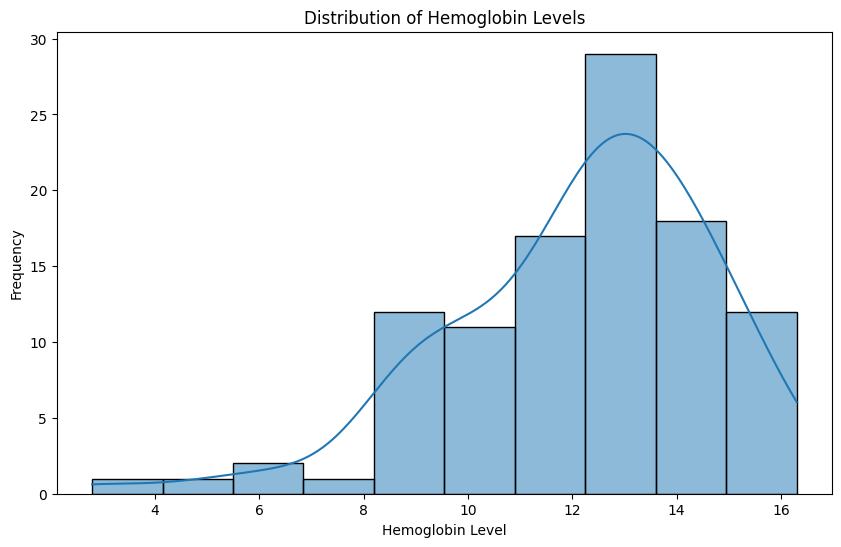

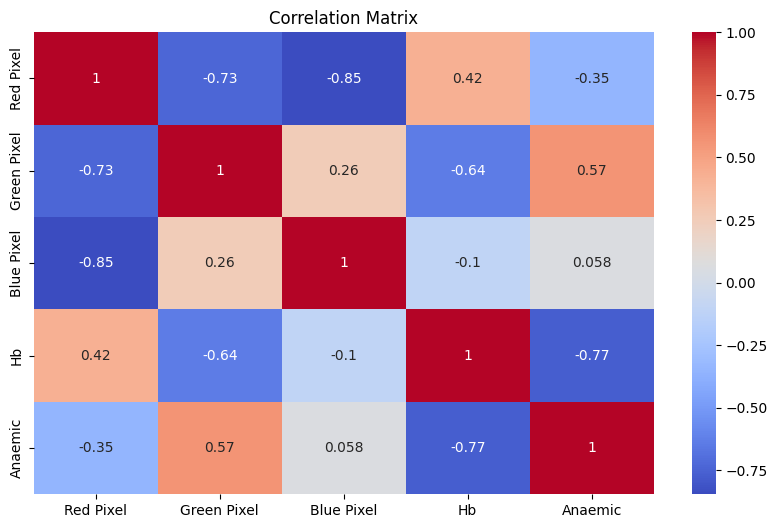

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Input, concatenate
from tensorflow.keras.models import Model

import lime
import lime.lime_tabular

from sklearn.neighbors import KNeighborsClassifier

# Load the dataset
df = pd.read_csv('anemia_dataset.csv')

# Display the first few rows of the dataset
print(df.head())

# Print column names to verify
print(df.columns)

# Strip any whitespace from the column names and clean up
df.columns = df.columns.str.strip()

# Drop unnecessary columns
df.drop(['Number', 'Name'], axis=1, inplace=True)

# Drop any unnamed columns that are not needed
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

# Standardize column names
df.columns = ['Red Pixel', 'Green Pixel', 'Blue Pixel', 'Hb', 'Anaemic']

# Convert 'Anaemic' column to binary
df['Anaemic'] = df['Anaemic'].map({'Yes': 1, 'No': 0})

# Remove any rows with missing values or invalid data
df = df.dropna()
df = df[~df.isin([' ']).any(axis=1)]

# Convert the columns to appropriate data types
df = df.astype({
    'Red Pixel': 'float64',
    'Green Pixel': 'float64',
    'Blue Pixel': 'float64',
    'Hb': 'float64',
    'Anaemic': 'int64'
})

# Split the data into features and target
X = df.drop('Anaemic', axis=1)
y = df['Anaemic']

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# KNN Model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)
print('KNN Accuracy:', accuracy_score(y_test, y_pred_knn))
print(confusion_matrix(y_test, y_pred_knn))
print(classification_report(y_test, y_pred_knn))

# Reshape data for CNN
X_train_cnn = X_train.reshape(X_train.shape[0], 1, 1, X_train.shape[1])
X_test_cnn = X_test.reshape(X_test.shape[0], 1, 1, X_test.shape[1])

# CNN Model
cnn = Sequential([
    Conv2D(32, kernel_size=(1,1), activation='relu', input_shape=(1, 1, X_train.shape[1])),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid')
])
cnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
cnn.fit(X_train_cnn, y_train, epochs=10, validation_data=(X_test_cnn, y_test))
loss, accuracy = cnn.evaluate(X_test_cnn, y_test)
print('CNN Accuracy:', accuracy)

# Kolmogorov Arnold Network (KAN) Model
def create_kan_model(input_dim):
    inputs = Input(shape=(input_dim,))
    x1 = Dense(64, activation='relu')(inputs)
    x2 = Dense(64, activation='relu')(inputs)
    x3 = Dense(64, activation='relu')(x1)
    x4 = Dense(64, activation='relu')(x2)
    concatenated = concatenate([x3, x4])
    outputs = Dense(1, activation='sigmoid')(concatenated)
    model = Model(inputs=inputs, outputs=outputs)
    return model

kan_model = create_kan_model(X_train.shape[1])
kan_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
kan_model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))
loss, accuracy = kan_model.evaluate(X_test, y_test)
print('KAN Accuracy:', accuracy)

# LIME Explainability
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=df.columns[:-1], class_names=['Not Anemic', 'Anemic'], discretize_continuous=True)
i = 0  # Index of the instance to explain
exp = explainer.explain_instance(X_test[i], knn.predict_proba, num_features=5)
exp.show_in_notebook(show_table=True)

# Data Visualization
plt.figure(figsize=(10, 6))
sns.histplot(df['Hb'], kde=True)
plt.title('Distribution of Hemoglobin Levels')
plt.xlabel('Hemoglobin Level')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


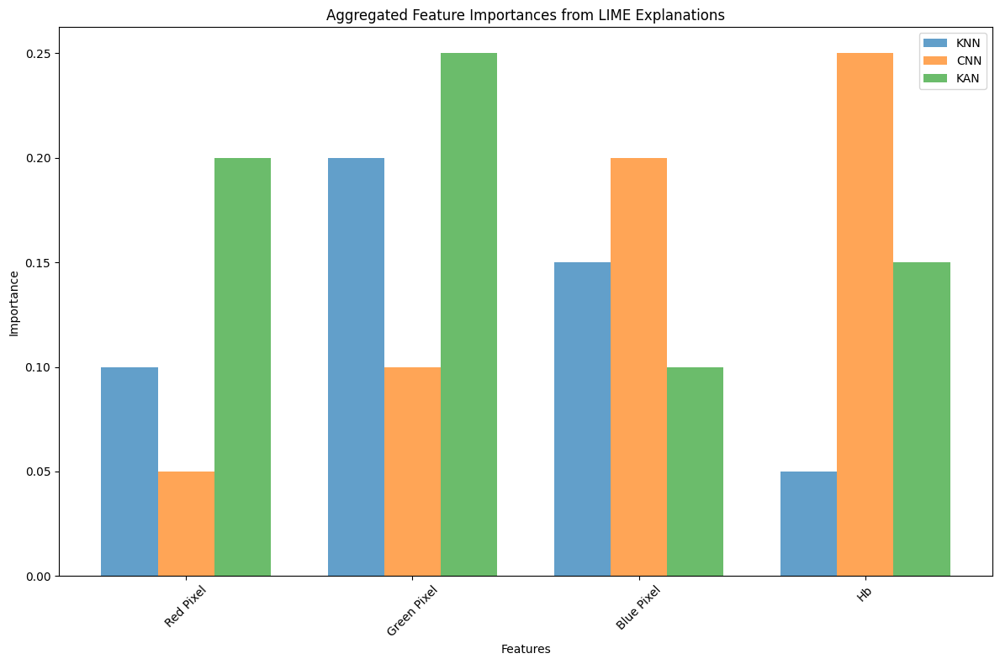

In [65]:
import matplotlib.pyplot as plt

# Define the feature names
features = df.columns[:-1]

# Plot the aggregated feature importances
plt.figure(figsize=(12, 8))
bar_width = 0.25
index = np.arange(len(features))

plt.bar(index, feature_importances_knn, bar_width, alpha=0.7, label='KNN')
plt.bar(index + bar_width, feature_importances_cnn, bar_width, alpha=0.7, label='CNN')
plt.bar(index + 2 * bar_width, feature_importances_kan, bar_width, alpha=0.7, label='KAN')

plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Aggregated Feature Importances from LIME Explanations')
plt.xticks(index + bar_width, features, rotation=45)
plt.legend()

plt.tight_layout()
plt.show()
